In [1]:
import pandas as pd

# Load the clustered WDI data
df = pd.read_csv('WDI_Grouped.csv')

# Filter data for Group B only
groupB_df = df[df['Group'].str.startswith('Group B')].copy()

# List of variables of interest
variables = [
    "Exports_GDP_percent",
    "GDP growth (annual %)",
    "GDP_per_capita",
    "Imports_GDP_percent",
    "Inflation, consumer prices (annual %)",
    "Population_growth_percent",
    "Unemployment, total (% of total labor force) (national estimate)"
]

# Compute the mean of each variable for Group B in each Year
groupB_mean_by_year = groupB_df.groupby('Year')[variables].mean(numeric_only=True).reset_index()
groupB_mean_by_year.head(3)  # preview the first few years

,Year,Exports_GDP_percent,GDP growth (annual %),GDP_per_capita,Imports_GDP_percent,"Inflation, consumer prices (annual %)",Population_growth_percent,"Unemployment, total (% of total labor force) (national estimate)"
0,2015,33.924691,4.604391,8.236511e+06,44.682466,1.920551,1.019400,2.879667
1,2016,35.656872,3.383037,6.121495e+06,42.618042,1.050868,0.800908,3.694333
2,2017,44.352724,5.129082,6.380499e+06,46.151132,2.566089,0.922288,3.107333


In [2]:
# Reshape data to long format for plotting
groupB_long = groupB_mean_by_year.melt(id_vars='Year', 
                                       value_vars=variables, 
                                       var_name='Variable', value_name='Value')

# Rename variables for cleaner display labels
rename_map = {
    "Exports_GDP_percent": "Exports (% of GDP)",
    "GDP growth (annual %)": "GDP Growth (%)",
    "GDP_per_capita": "GDP per Capita",
    "Imports_GDP_percent": "Imports (% of GDP)",
    "Inflation, consumer prices (annual %)": "Inflation (%)",
    "Population_growth_percent": "Population Growth (%)",
    "Unemployment, total (% of total labor force) (national estimate)": "Unemployment (%)"
}
groupB_long['Variable'] = groupB_long['Variable'].map(rename_map)
groupB_long.head(3)


,Year,Variable,Value
0,2015,Exports (% of GDP),33.924691
1,2016,Exports (% of GDP),35.656872
2,2017,Exports (% of GDP),44.352724


In [3]:
import plotly.express as px

# Create interactive bar chart with Plotly
fig = px.bar(
    groupB_long, 
    x='Variable', 
    y='Value', 
    color='Variable',
    animation_frame='Year',
    title='Group B Variables Over Time (2015–2024)',
    labels={'Variable': 'Variable', 'Value': 'Value'},
    hover_data=['Year']  # include Year in hover tooltip
)

# Improve layout: adjust y-axis range and legend
fig.update_layout(
    yaxis_title='Average Value',
    legend_title_text='Variables',
    yaxis=dict(range=[0, groupB_long['Value'].max() * 1.1])  # add some headroom on y-axis
)

# Customize hover tooltips for clarity
fig.update_traces(hovertemplate="<b>%{x}</b><br>Year: %{customdata[0]}<br>Value: %{y:.2f}<extra></extra>")

# Show the figure (in a Jupyter environment, use fig.show())
fig.write_html("GroupB_analysis.html", auto_open=True)  # or save to an HTML file for sharing


### 现在存在几个问题，1. 国家的名字一定是不能丢的，因为我关键就是要看每一年哪些国家因为哪些指标在GroupA,B,C之间变动。所以Country Name z这一列是不能省的，而且非常重要。2. 如图所示这个可视化结果其他所有的变量都没有显示出来，请您详细检查，如果是解释程度小，但是应该不至于为0，而且我希望是解释的百分比程度，这样一个柱形图我一点不知道这个变量解释程度占整体的多少，其他每个变量指标分别占比多少，而且图1还存在一个问题，复选变量指标的时候，选中和没有选中不明显，我希望每个变量前面有一个复选框显示是否选中，点击变量名和复选框都可以进行交互。 3. 然后关于图1，我希望悬停上来的时候，能够显示该Group的全部国家，全部展示出来不省略因为这是我数据分析的关键。4. 我不希望新开一个页面展示，我就希望在ipynb的结果栏中直接输出结果出来，请您调整好最合适的大小。 请您重新根据我的要求完善更改全部的代码，满足我所有的修改要求。

In [ ]:
# 修改版本

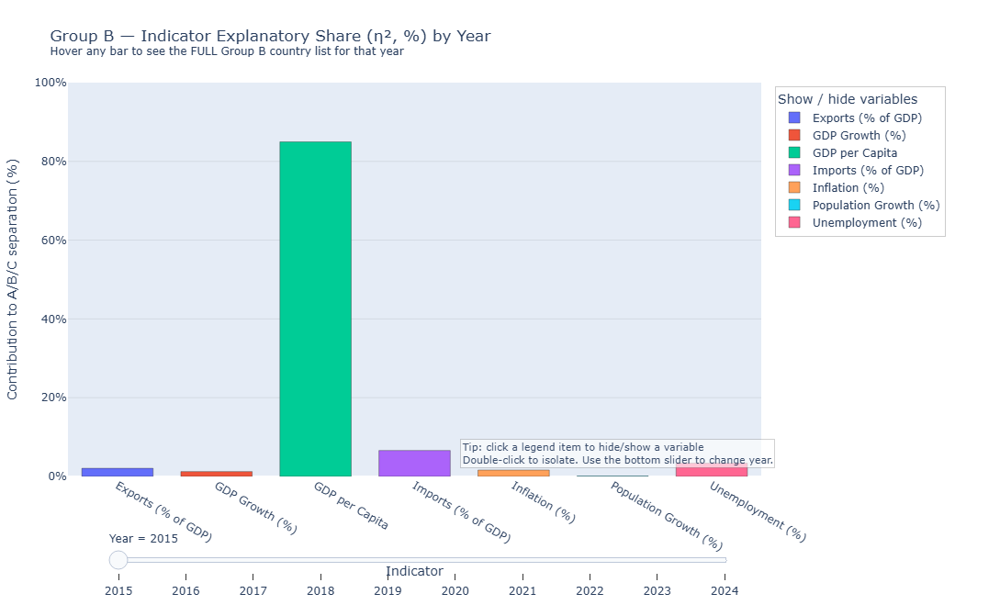

In [6]:
# --- Imports
import os, math
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# --- Robust path resolution for the CSV
CANDIDATES = ["WDI_Grouped.csv", "WDI_Grouped.csv"]
csv_path = next((p for p in CANDIDATES if os.path.exists(p)), None)
if csv_path is None:
    raise FileNotFoundError("WDI_Grouped.csv not found. Put it next to the notebook or in /mnt/data/")

# --- Load and basic prep
df = pd.read_csv(csv_path)
# normalize column names we will use
assert "Country Name" in df.columns, "CSV must contain 'Country Name'"
assert "Year" in df.columns and "Group" in df.columns, "CSV must contain 'Year' and 'Group'"

df["Year"] = pd.to_numeric(df["Year"], errors="coerce").astype("Int64")

# raw indicator columns in the file
raw_to_label = {
    "Exports_GDP_percent": "Exports (% of GDP)",
    "GDP growth (annual %)": "GDP Growth (%)",
    "GDP_per_capita": "GDP per Capita",
    "Imports_GDP_percent": "Imports (% of GDP)",
    "Inflation, consumer prices (annual %)": "Inflation (%)",
    "Population_growth_percent": "Population Growth (%)",
    "Unemployment, total (% of total labor force) (national estimate)": "Unemployment (%)",
}
ind_cols = list(raw_to_label.keys())
disp_labels = [raw_to_label[c] for c in ind_cols]

# --- Build: full Group B membership by year (for hover)
def _wrap_lines(names, per_line=6):
    """Return HTML with <br> every N names (no truncation)."""
    names = list(names)
    lines = []
    for i in range(0, len(names), per_line):
        lines.append("; ".join(names[i:i+per_line]))
    return "<br>".join(lines) if lines else "(no Group B members)"

groupB_members_by_year = (
    df[df["Group"].str.startswith("Group B", na=False)]
    .groupby("Year")["Country Name"]
    .apply(lambda s: sorted(set(x for x in s.dropna())))
    .to_dict()
)
groupB_members_text = {y: _wrap_lines(v, per_line=6) for y, v in groupB_members_by_year.items()}

# --- Compute η² (between-group separation) per indicator, per year
def eta_squared_for_year(dyear: pd.DataFrame, col: str) -> float:
    # mask non-null values for this indicator and group label
    m = dyear[col].notna() & dyear["Group"].notna()
    if m.sum() < 3:  # too few data points to compute meaningfully
        return np.nan
    x = dyear.loc[m, col].astype(float)
    g = dyear.loc[m, "Group"]
    overall = x.mean()
    ss_total = ((x - overall) ** 2).sum()
    if ss_total <= 0:
        return np.nan
    ss_between = 0.0
    for _, sub in x.groupby(g):
        mu = sub.mean()
        n = sub.shape[0]
        ss_between += n * (mu - overall) ** 2
    return float(ss_between / ss_total)

years = sorted(int(y) for y in df["Year"].dropna().unique())
eta_rows = []
for y in years:
    dyear = df[df["Year"] == y]
    row = {"Year": y}
    for col in ind_cols:
        row[col] = eta_squared_for_year(dyear, col)
    eta_rows.append(row)

eta_df = pd.DataFrame(eta_rows)

# --- Convert η² to "share (%)" so bars are comparable and sum to 100% per year
long_rows = []
for _, r in eta_df.iterrows():
    y = int(r["Year"])
    vals = [r[c] for c in ind_cols]
    denom = np.nansum(vals)
    for col in ind_cols:
        eta = r[col]
        share_pct = (eta / denom * 100.0) if (denom > 0 and pd.notna(eta)) else np.nan
        long_rows.append({
            "Year": y,
            "Variable": raw_to_label[col],
            "Share (%)": share_pct
        })
share_df = pd.DataFrame(long_rows)

# --- Prepare the animated bar chart with a bottom slider
init_year = years[0]
fig = go.Figure()

# Initial traces (one trace per Variable so legend acts like individual checkboxes)
for var in disp_labels:
    val = share_df.loc[(share_df["Year"] == init_year) & (share_df["Variable"] == var), "Share (%)"]
    y_val = float(val.iloc[0]) if not val.empty and pd.notna(val.iloc[0]) else None
    # full Group B membership list for hover, no truncation
    members_txt = groupB_members_text.get(init_year, "(no Group B members)")
    fig.add_trace(go.Bar(
        x=[var],
        y=[y_val],
        name=var,  # makes the legend entry clickable (checkbox-like)
        customdata=[[init_year, members_txt]],
        hovertemplate=(
            "<b>%{x}</b><br>"
            "Year: %{customdata[0]}<br>"
            "Contribution to A/B/C separation: %{y:.2f}%"
            "<br><br><b>Group B members</b>:<br>%{customdata[1]}"
            "<extra></extra>"
        ),
        # a subtle outline to make selected bars visually distinct
        marker_line=dict(width=1, color="rgba(50,50,50,0.4)")
    ))

# Frames for each Year (keep trace order fixed so legend toggles persist)
frames = []
for y in years:
    members_txt = groupB_members_text.get(y, "(no Group B members)")
    frame_data = []
    for var in disp_labels:
        val = share_df.loc[(share_df["Year"] == y) & (share_df["Variable"] == var), "Share (%)"]
        y_val = float(val.iloc[0]) if not val.empty and pd.notna(val.iloc[0]) else None
        frame_data.append(go.Bar(
            x=[var],
            y=[y_val],
            name=var,
            customdata=[[y, members_txt]],
        ))
    frames.append(go.Frame(name=str(y), data=frame_data))
fig.frames = frames

# Slider at the bottom (inside the figure)
steps = [{
    "args": [[str(y)], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}],
    "label": str(y),
    "method": "animate",
} for y in years]

sliders = [{
    "active": 0,
    "yanchor": "top",
    "xanchor": "left",
    "currentvalue": {"prefix": "Year = "},
    "pad": {"t": 30},
    "len": 0.90,
    "x": 0.06,
    "y": -0.06,
    "steps": steps
}]

# Layout: keep it inside the notebook, large enough but not oversized
fig.update_layout(
    title="Group B — Indicator Explanatory Share (η², %) by Year<br>"
          "<sup>Hover any bar to see the FULL Group B country list for that year</sup>",
    xaxis_title="Indicator",
    yaxis_title="Contribution to A/B/C separation (%)",
    yaxis=dict(range=[0, 100], ticksuffix="%", gridcolor="rgba(0,0,0,0.08)"),
    bargap=0.28,
    width=1100,
    height=640,
    margin=dict(l=70, r=260, t=90, b=110),
    sliders=sliders,
    # Legend styled as a checkbox panel (click color box or label to toggle)
    legend=dict(
        title="Show / hide variables",
        orientation="v",
        yanchor="top", y=0.99,
        xanchor="left", x=1.02,  # place to the right
        bgcolor="rgba(255,255,255,0.90)",
        bordercolor="rgba(0,0,0,0.2)",
        borderwidth=1,
        itemclick="toggle",         # single-click toggles
        itemdoubleclick="toggleothers",  # double-click isolates
        font=dict(size=12),
    ),
    hoverlabel=dict(align="left")  # align long country lists nicely
)

# A little guidance annotation
fig.add_annotation(
    x=1.02, y=0.02, xref="paper", yref="paper", showarrow=False, align="left",
    text="Tip: click a legend item to hide/show a variable<br>"
         "Double-click to isolate. Use the bottom slider to change year.",
    font=dict(size=11),
    bgcolor="rgba(255,255,255,0.7)", bordercolor="rgba(0,0,0,0.2)", borderwidth=1, opacity=0.9
)

# Show in-notebook (no new tab)
fig.show()


# 这里解决如图1所示，我需要做出以下的修改： 1. 把tip加到右边侧面空白区域。 2. 我希望您能够在每个柱状体的上方一点点显示该柱状体的解释程度，即不在内部显示，而是在每个柱体的正上方一点点。 3. 注意有些文字不要重叠了。请您重新修改调整完善。

存在问题，依然没有具体分析出变化的具体原因，所以：然后因为有一些国家在不同组之间变化嘛，但是很多国家在组之间都没有变化，所以我希望得到一组该Group的各变量的均值，我希望您同样展现在图上，因为我之后还要做不同的组，所以我希望每个Group的各变量的均值可以根据组的不同来自行计算得到正确的结果并且可视化。

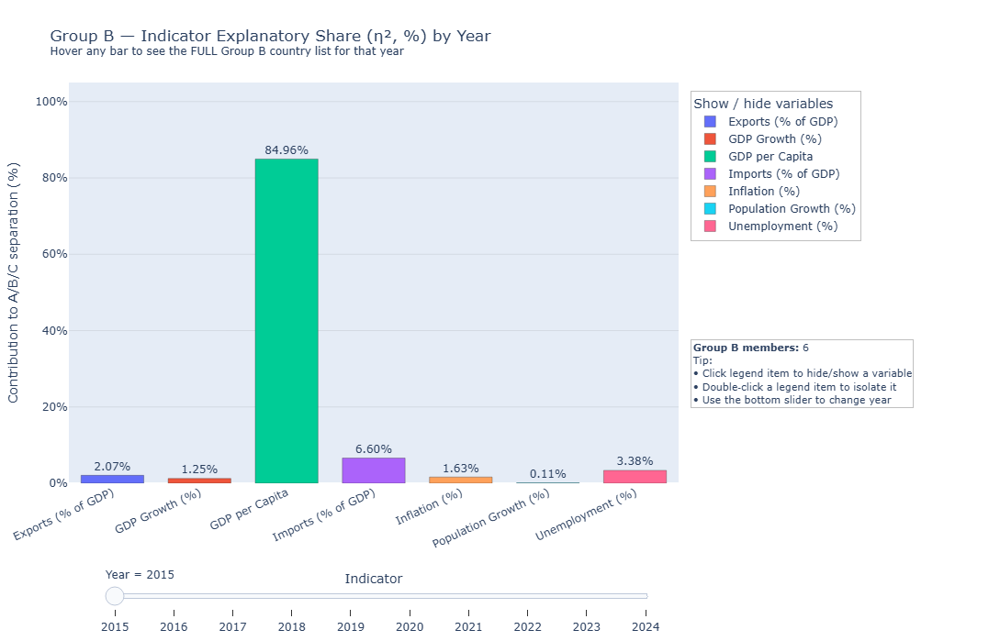

In [1]:
# --- Imports
import os
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# --- Robust path resolution for the CSV
CANDIDATES = ["WDI_Grouped.csv", "/mnt/data/WDI_Grouped.csv"]
csv_path = next((p for p in CANDIDATES if os.path.exists(p)), None)
if csv_path is None:
    raise FileNotFoundError("WDI_Grouped.csv not found. Put it next to the notebook or in /mnt/data/")

# --- Load and basic prep
df = pd.read_csv(csv_path)
assert "Country Name" in df.columns
assert "Year" in df.columns and "Group" in df.columns

df["Year"] = pd.to_numeric(df["Year"], errors="coerce").astype("Int64")

# Indicator mapping
raw_to_label = {
    "Exports_GDP_percent": "Exports (% of GDP)",
    "GDP growth (annual %)": "GDP Growth (%)",
    "GDP_per_capita": "GDP per Capita",
    "Imports_GDP_percent": "Imports (% of GDP)",
    "Inflation, consumer prices (annual %)": "Inflation (%)",
    "Population_growth_percent": "Population Growth (%)",
    "Unemployment, total (% of total labor force) (national estimate)": "Unemployment (%)",
}
ind_cols    = list(raw_to_label.keys())
disp_labels = [raw_to_label[c] for c in ind_cols]

# --- FULL Group B membership by year (for hover + count)
def _wrap_lines(names, per_line=6):
    names = list(names)
    lines = []
    for i in range(0, len(names), per_line):
        lines.append("; ".join(names[i:i+per_line]))
    return "<br>".join(lines) if lines else "(no Group B members)"

groupB_members_by_year = (
    df[df["Group"].str.startswith("Group B", na=False)]
      .groupby("Year")["Country Name"]
      .apply(lambda s: sorted(set(x for x in s.dropna())))
      .to_dict()
)
groupB_members_text  = {y: _wrap_lines(v, per_line=6) for y, v in groupB_members_by_year.items()}
groupB_member_count  = {y: (len(v) if isinstance(v, list) else 0) for y, v in groupB_members_by_year.items()}

# --- η² (between-group separation) per indicator/year
def eta_squared_for_year(dyear: pd.DataFrame, col: str) -> float:
    m = dyear[col].notna() & dyear["Group"].notna()
    if m.sum() < 3:
        return np.nan
    x = dyear.loc[m, col].astype(float)
    g = dyear.loc[m, "Group"]
    overall = x.mean()
    ss_total = ((x - overall) ** 2).sum()
    if ss_total <= 0:
        return np.nan
    ss_between = 0.0
    for _, sub in x.groupby(g):
        mu = sub.mean(); n = sub.shape[0]
        ss_between += n * (mu - overall) ** 2
    return float(ss_between / ss_total)

years = sorted(int(y) for y in df["Year"].dropna().unique())
eta_rows = []
for y in years:
    dyear = df[df["Year"] == y]
    row = {"Year": y}
    for col in ind_cols:
        row[col] = eta_squared_for_year(dyear, col)
    eta_rows.append(row)

eta_df = pd.DataFrame(eta_rows)

# --- Normalize η² to shares (%) that sum to 100 each year
long_rows = []
for _, r in eta_df.iterrows():
    y = int(r["Year"])
    vals = [r[c] for c in ind_cols]
    denom = np.nansum(vals)
    for col in ind_cols:
        eta = r[col]
        share_pct = (eta / denom * 100.0) if (denom > 0 and pd.notna(eta)) else np.nan
        long_rows.append({"Year": y, "Variable": raw_to_label[col], "Share (%)": share_pct})
share_df = pd.DataFrame(long_rows)

# --- Helper: value label text
def _to_text(yval):
    return f"{yval:.2f}%" if (yval is not None and np.isfinite(yval)) else ""

# --- Helper: build the right‑side annotation (TIP + dynamic member count)
def build_side_tip(year:int):
    cnt = groupB_member_count.get(year, 0)
    tip_text = (
        f"<b>Group B members:</b> {cnt}<br>"
        "Tip:<br>"
        "• Click legend item to hide/show a variable<br>"
        "• Double‑click a legend item to isolate it<br>"
        "• Use the bottom slider to change year"
    )
    return dict(
        x=1.02, y=0.36,                # under the legend (right blank area)
        xref="paper", yref="paper",
        xanchor="left", yanchor="top",
        showarrow=False, align="left",
        text=tip_text,
        font=dict(size=11),
        bgcolor="rgba(255,255,255,0.92)",
        bordercolor="rgba(0,0,0,0.25)",
        borderwidth=1,
        opacity=0.98
    )

# --- Build animated bar chart
init_year = years[0]
fig = go.Figure()

# Initial traces (one per variable -> checkbox-like legend)
for var in disp_labels:
    yseries = share_df.loc[(share_df["Year"] == init_year) & (share_df["Variable"] == var), "Share (%)"]
    y_val = float(yseries.iloc[0]) if not yseries.empty and pd.notna(yseries.iloc[0]) else None
    members_txt = groupB_members_text.get(init_year, "(no Group B members)")
    members_cnt = groupB_member_count.get(init_year, 0)
    fig.add_trace(go.Bar(
        x=[var], y=[y_val], name=var,
        text=[_to_text(y_val)], textposition="outside",
        cliponaxis=False,  # allow label above 100%
        customdata=[[init_year, members_txt, members_cnt]],
        hovertemplate=(
            "<b>%{x}</b><br>"
            "Year: %{customdata[0]}<br>"
            "Contribution to A/B/C separation: %{y:.2f}%"
            "<br><br><b>Group B members (%{customdata[2]})</b>:<br>%{customdata[1]}"
            "<extra></extra>"
        ),
        marker_line=dict(width=1, color="rgba(50,50,50,0.35)")
    ))

# Frames (data + layout.annotations 更新，让 Tip 与成员数量随年变化)
frames = []
for y in years:
    members_txt = groupB_members_text.get(y, "(no Group B members)")
    members_cnt = groupB_member_count.get(y, 0)
    fdata = []
    for var in disp_labels:
        yseries = share_df.loc[(share_df["Year"] == y) & (share_df["Variable"] == var), "Share (%)"]
        y_val = float(yseries.iloc[0]) if not yseries.empty and pd.notna(yseries.iloc[0]) else None
        fdata.append(go.Bar(
            x=[var], y=[y_val], name=var,
            text=[_to_text(y_val)], textposition="outside",
            cliponaxis=False,
            customdata=[[y, members_txt, members_cnt]],
        ))
    frames.append(go.Frame(
        name=str(y),
        data=fdata,
        layout=go.Layout(annotations=[build_side_tip(y)])   # <-- 动态 Tip + 计数
    ))
fig.frames = frames

# --- Slider (稍微下移避免与 x 轴标题重叠)
steps = [{
    "args": [[str(y)], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}],
    "label": str(y), "method": "animate",
} for y in years]

sliders = [{
    "active": 0, "yanchor": "top", "xanchor": "left",
    "currentvalue": {"prefix": "Year = "},
    "pad": {"t": 36},
    "len": 0.90, "x": 0.06, "y": -0.12,
    "steps": steps
}]

# --- Layout & styling
fig.update_layout(
    title=("Group B — Indicator Explanatory Share (η², %) by Year"
           "<br><sup>Hover any bar to see the FULL Group B country list for that year</sup>"),
    xaxis_title="Indicator",
    yaxis_title="Contribution to A/B/C separation (%)",
    xaxis=dict(title_standoff=26, tickangle=-25, automargin=True),
    yaxis=dict(range=[0, 105], ticksuffix="%", gridcolor="rgba(0,0,0,0.08)"),
    bargap=0.28,
    width=1100, height=680,
    margin=dict(l=70, r=350, t=90, b=160),   # 右侧留白以容纳 Tip
    sliders=sliders,
    legend=dict(
        title="Show / hide variables",
        orientation="v",
        yanchor="top", y=0.98,
        xanchor="left", x=1.02,              # legend 右侧
        bgcolor="rgba(255,255,255,0.92)",
        bordercolor="rgba(0,0,0,0.25)", borderwidth=1,
        itemclick="toggle", itemdoubleclick="toggleothers",
        font=dict(size=12),
    ),
    hoverlabel=dict(align="left"),
    uniformtext_mode="hide",   # 避免顶部数值标签相互遮挡
    uniformtext_minsize=9,
    annotations=[build_side_tip(init_year)]  # 初始 Tip（含成员数量）
)

fig.show()


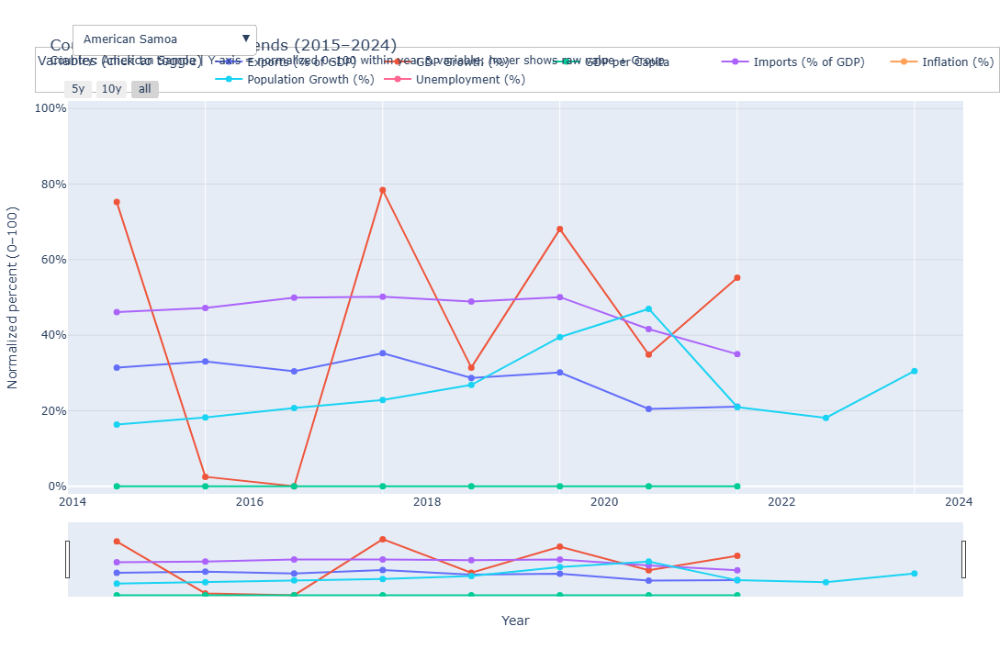

In [1]:
# ========== Interactive line chart (2015–2024) with country dropdown & variable checkboxes ==========
import os
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# -------------------------
# 1) Load & tidy the data
# -------------------------
CANDIDATES = ["WDI_Grouped.csv", "/mnt/data/WDI_Grouped.csv"]
csv_path = next((p for p in CANDIDATES if os.path.exists(p)), None)
if csv_path is None:
    raise FileNotFoundError("WDI_Grouped.csv not found. Put it next to the notebook or in /mnt/data/")

df = pd.read_csv(csv_path)
assert "Country Name" in df.columns
assert "Year" in df.columns and "Group" in df.columns

# variables to analyze
raw_to_label = {
    "Exports_GDP_percent": "Exports (% of GDP)",
    "GDP growth (annual %)": "GDP Growth (%)",
    "GDP_per_capita": "GDP per Capita",
    "Imports_GDP_percent": "Imports (% of GDP)",
    "Inflation, consumer prices (annual %)": "Inflation (%)",
    "Population_growth_percent": "Population Growth (%)",
    "Unemployment, total (% of total labor force) (national estimate)": "Unemployment (%)",
}
ind_cols    = list(raw_to_label.keys())
disp_labels = [raw_to_label[c] for c in ind_cols]

# normalize basic fields
df["Year"] = pd.to_numeric(df["Year"], errors="coerce").astype("Int64")
df = df.dropna(subset=["Year", "Country Name"])  # ensure we have year + country

# long format (Country, Year, Group, Variable, Value)
long = df[["Country Name", "Year", "Group", *ind_cols]].melt(
    id_vars=["Country Name", "Year", "Group"],
    value_vars=ind_cols,
    var_name="Variable_raw",
    value_name="Value"
)
long["Variable"] = long["Variable_raw"].map(raw_to_label)

# -------------------------
# 2) Compute normalized percent (0-100) per year & variable across countries
# -------------------------
# For each (Year, Variable), min-max normalize Value to 0–100.
grp = long.groupby(["Year", "Variable"], dropna=False)
minv = grp["Value"].transform("min")
maxv = grp["Value"].transform("max")
rng  = (maxv - minv)

# Avoid divide-by-zero: if all values equal, mark as NaN (no variation that year)
norm_pct = np.where(rng > 0, (long["Value"] - minv) / rng * 100.0, np.nan)
long["Percent"] = norm_pct

# A date-like axis for the rangeslider (Jan-01 of each year)
long["YearDate"] = pd.to_datetime(long["Year"].astype(str) + "-01-01", errors="coerce")

# Country list (sorted)
countries = sorted(long["Country Name"].dropna().unique().tolist())

# For fast updates: build a dictionary for each country with series per variable
years_sorted = sorted(long["Year"].dropna().unique().tolist())
x_date = pd.to_datetime(pd.Series(years_sorted).astype(str) + "-01-01")

country_data = {}  # {country: {var_label: {"x":..., "y":..., "raw":..., "grp":...}}}
for c in countries:
    sub = long[long["Country Name"] == c]
    # make sure we cover all years for each variable in consistent order
    d = {}
    for var in disp_labels:
        sv = sub[sub["Variable"] == var].sort_values("Year")
        # align to global years_sorted; reindex to ensure same length
        # build a temporary series indexed by Year
        perc = sv.set_index("Year")["Percent"].reindex(years_sorted)
        raw  = sv.set_index("Year")["Value"].reindex(years_sorted)
        grp  = sv.set_index("Year")["Group"].reindex(years_sorted)

        d[var] = {
            "x": x_date,                             # datetime years (for rangeslider)
            "y": perc.values.astype(float),          # normalized percent 0–100
            "raw": raw.values.astype(float),         # raw value
            "grp": grp.fillna("(unknown)").values    # group label per year
        }
    country_data[c] = d

# -------------------------
# 3) Build the figure (7 traces = 7 variables). Dropdown swaps the data arrays.
# -------------------------
init_country = countries[0]  # default
init_payload = country_data[init_country]

fig = go.Figure()

# A consistent hover template for all variables
hover_tmpl = (
    "<b>%{fullData.name}</b><br>"
    "Year: %{x|%Y}<br>"
    "Percent: %{y:.2f}%<br>"
    "Value: %{customdata[0]:,.2f}<br>"
    "Group: %{customdata[1]}"
    "<extra></extra>"
)

for var in disp_labels:
    cd = np.column_stack((init_payload[var]["raw"], init_payload[var]["grp"]))
    fig.add_trace(go.Scatter(
        x=init_payload[var]["x"],
        y=init_payload[var]["y"],
        customdata=cd,
        name=var,                             # appears once in legend (checkbox-like)
        mode="lines+markers",
        hovertemplate=hover_tmpl,
        line=dict(width=2),
        marker=dict(size=7)
    ))

# -------------------------
# 4) Country dropdown: update 'y' and 'customdata' for all 7 traces
# -------------------------
buttons = []
for c in countries:
    payload = country_data[c]
    y_list  = [payload[v]["y"] for v in disp_labels]
    cd_list = [np.column_stack((payload[v]["raw"], payload[v]["grp"])) for v in disp_labels]

    # Note: when using method='update', the first dict updates trace-level props,
    # the second dict updates layout-level props (here, we change the subtitle).
    buttons.append(dict(
        label=c,
        method="update",
        args=[
            # trace updates (apply to all traces in order)
            {"y": y_list, "customdata": cd_list},
            # layout updates
            {"title": {
                "text": ("Country-level Indicator Trends (2015–2024)<br>"
                         f"<sup>Country: {c} | Y-axis = normalized 0–100 within year & variable; "
                         "hover shows raw value + Group</sup>")
            }}
        ],
    ))

# -------------------------
# 5) Layout, rangeslider, legend “checkboxes”
# -------------------------
fig.update_layout(
    title=("Country-level Indicator Trends (2015–2024)"
           "<br><sup>Country: "
           f"{init_country}"
           " | Y-axis = normalized 0–100 within year & variable; hover shows raw value + Group</sup>"),
    xaxis_title="Year",
    yaxis_title="Normalized percent (0–100)",
    xaxis=dict(
        type="date",
        tickformat="%Y",
        ticklabelmode="period",
        rangeslider=dict(visible=True),  # rangeslider at bottom
        rangeselector=dict(
            buttons=[
                dict(count=5, label="5y", step="year", stepmode="backward"),
                dict(count=10, label="10y", step="year", stepmode="backward"),
                dict(step="all")
            ]
        )
    ),
    yaxis=dict(range=[-2, 102], ticksuffix="%", gridcolor="rgba(0,0,0,0.08)"),
    width=1120, height=700,
    margin=dict(l=70, r=40, t=110, b=70),
    legend=dict(
        title="Variables (click to toggle)",
        orientation="h", yanchor="bottom", y=1.02, xanchor="left", x=0.0,
        bgcolor="rgba(255,255,255,0.9)",
        bordercolor="rgba(0,0,0,0.25)", borderwidth=1,
        itemclick="toggle", itemdoubleclick="toggleothers",
        font=dict(size=12)
    ),
    hoverlabel=dict(align="left"),
    updatemenus=[
        dict(
            type="dropdown",
            direction="down",
            showactive=True,
            x=0.0, xanchor="left",
            y=1.20, yanchor="top",
            active=0,
            bgcolor="white",
            bordercolor="rgba(0,0,0,0.25)", borderwidth=1,
            buttons=buttons,
            pad=dict(t=2, r=4, b=2, l=4)
        )
    ]
)

fig.show()

In [ ]:
这个地方的图之所以画错，我认为是变量的解释程度和重要性是不一样的，贡献程度是发生了改变的，所以不能直接做百分比。明天再思考解决方式。

z - score

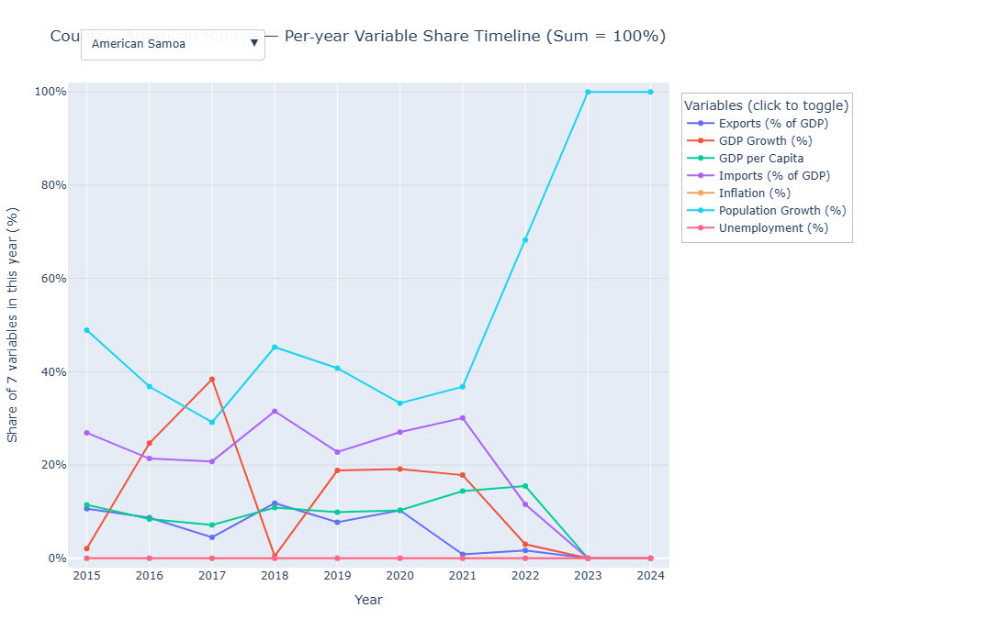

In [1]:
# ============================
# Country line chart (2015–2024)
# - Legend on the RIGHT (checkbox-like)
# - No bottom rangeslider
# - Per-year shares across 7 variables sum to 100% (per-country)
#   Share = normalized absolute z-score contribution within year
# - Hover: Year, Percent, Value, Group
# ============================

import os
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# ---------- Load data
CANDIDATES = ["WDI_Grouped.csv", "/mnt/data/WDI_Grouped.csv"]
csv_path = next((p for p in CANDIDATES if os.path.exists(p)), None)
if csv_path is None:
    raise FileNotFoundError("WDI_Grouped.csv not found. Put it next to the notebook or in /mnt/data/")

df = pd.read_csv(csv_path)
assert "Country Name" in df.columns
assert "Year" in df.columns and "Group" in df.columns

# keep the assignment window
df["Year"] = pd.to_numeric(df["Year"], errors="coerce").astype("Int64")
df = df[(df["Year"] >= 2015) & (df["Year"] <= 2024)].copy()

# ---------- Variable mapping
raw_to_label = {
    "Exports_GDP_percent": "Exports (% of GDP)",
    "GDP growth (annual %)": "GDP Growth (%)",
    "GDP_per_capita":      "GDP per Capita",
    "Imports_GDP_percent": "Imports (% of GDP)",
    "Inflation, consumer prices (annual %)": "Inflation (%)",
    "Population_growth_percent": "Population Growth (%)",
    "Unemployment, total (% of total labor force) (national estimate)": "Unemployment (%)",
}
ind_cols    = list(raw_to_label.keys())
disp_labels = [raw_to_label[c] for c in ind_cols]

# ---------- Long (Country, Year, Group, Variable, Value)
long = df[["Country Name", "Year", "Group", *ind_cols]].melt(
    id_vars=["Country Name", "Year", "Group"],
    value_vars=ind_cols,
    var_name="Variable_raw",
    value_name="Value"
)
long.rename(columns={"Country Name": "Country"}, inplace=True)
long["Variable"] = long["Variable_raw"].map(raw_to_label)

# ---------- z-score within (Year, Variable) across countries
stats = (long
         .groupby(["Year", "Variable"], dropna=False)["Value"]
         .agg(["mean", "std"])
         .reset_index()
         .rename(columns={"mean": "mu", "std": "sigma"}))
long = long.merge(stats, on=["Year", "Variable"], how="left")

# z = (x - mu) / sigma; if sigma==0 or NaN -> z=0 (变量该年无离差)
long["z"] = 0.0
mask = long["sigma"].notna() & (long["sigma"] > 0) & long["Value"].notna()
long.loc[mask, "z"] = (long.loc[mask, "Value"] - long.loc[mask, "mu"]) / long.loc[mask, "sigma"]

# ---------- Per-year shares across 7 variables sum to 100% (per-country)
long["abs_z"] = long["z"].abs()
den = (long.groupby(["Country", "Year"], dropna=False)["abs_z"]
            .transform("sum"))
# 若该国该年的 7 个变量都缺或都为零，share 记作 NaN
long["Share"] = np.where((den > 0) & long["abs_z"].notna(),
                         long["abs_z"] / den * 100.0, np.nan)

# 排序，准备绘图
years_all = list(range(2015, 2025))
countries = sorted(long["Country"].dropna().unique().tolist())
init_country = countries[0] if countries else None

# ---------- Helper: build y & customdata arrays for a country (7 variables)
def arrays_for_country(country: str):
    ylist, cdlist = [], []
    cdf = long[long["Country"] == country]
    for var in disp_labels:
        vdf = cdf[cdf["Variable"] == var]
        # maps by year
        mp_share = dict(zip(vdf["Year"], vdf["Share"]))
        mp_val   = dict(zip(vdf["Year"], vdf["Value"]))
        mp_group = dict(zip(vdf["Year"], vdf["Group"]))  # group is 年-国层面，变量一致
        y_arr, cd_arr = [], []
        for y in years_all:
            s = mp_share.get(y, np.nan)   # percent share
            v = mp_val.get(y, np.nan)     # raw value
            g = mp_group.get(y, None)     # group label
            y_arr.append(float(s) if pd.notna(s) else None)
            cd_arr.append([y,
                           (float(s) if pd.notna(s) else None),
                           (float(v) if pd.notna(v) else None),
                           g])
        ylist.append(y_arr)
        cdlist.append(cd_arr)
    return ylist, cdlist

# ---------- Build figure
if init_country is None:
    raise ValueError("No countries found after filtering 2015–2024.")

init_y, init_cd = arrays_for_country(init_country)
fig = go.Figure()

hover_tmpl = (
    "Year: %{customdata[0]}<br>"
    "Percent: %{customdata[1]:.2f}%<br>"
    "Value: %{customdata[2]:.6g}<br>"
    "Group: %{customdata[3]}<extra></extra>"
)

for i, var in enumerate(disp_labels):
    fig.add_trace(go.Scatter(
        x=years_all,
        y=init_y[i],
        customdata=init_cd[i],
        mode="lines+markers",
        name=var,                        # legend (checkbox)
        hovertemplate=hover_tmpl,
        line=dict(width=2),
        marker=dict(size=6),
        connectgaps=False
    ))

# ---------- Country dropdown: update 7 traces' y & customdata
buttons = []
for c in countries:
    ys, cds = arrays_for_country(c)
    buttons.append(dict(
        label=c,
        method="update",
        args=[
            {"y": ys, "customdata": cds},   # trace-level
            {"title": f"Country: {c} — Per‑year Variable Share Timeline (Sum = 100%)"}  # layout-level
        ]
    ))

# ---------- Layout (legend on the RIGHT, no bottom slider)
fig.update_layout(
    title=f"Country: {init_country} — Per‑year Variable Share Timeline (Sum = 100%)",
    xaxis_title="Year",
    yaxis_title="Share of 7 variables in this year (%)",
    xaxis=dict(
        tickmode="array",
        tickvals=years_all,
        ticktext=[str(y) for y in years_all],
        dtick=1,
        range=[2014.7, 2024.3],      # small padding
        rangeslider=dict(visible=False),   # <-- remove bottom interaction
        rangeselector=dict(visible=False)  # <-- remove quick buttons
    ),
    yaxis=dict(range=[-2, 102], ticksuffix="%", gridcolor="rgba(0,0,0,0.08)"),
    width=1120, height=680,
    margin=dict(l=70, r=360, t=90, b=80),  # right margin for legend
    legend=dict(
        title="Variables (click to toggle)",
        orientation="v",
        yanchor="top", y=0.98,
        xanchor="left", x=1.02,           # <-- legend on the right like Fig.2
        bgcolor="rgba(255,255,255,0.92)",
        bordercolor="rgba(0,0,0,0.25)", borderwidth=1,
        itemclick="toggle", itemdoubleclick="toggleothers",
        font=dict(size=12),
    ),
    hovermode="x",   # per-x hover; change to "x unified" if you prefer a single hover box
    updatemenus=[
        dict(
            type="dropdown",
            direction="down",
            showactive=True,
            x=0.01, xanchor="left",
            y=1.12, yanchor="top",
            bgcolor="rgba(255,255,255,0.95)",
            bordercolor="rgba(0,0,0,0.2)", borderwidth=1,
            pad={"r": 6, "t": 4, "b": 4, "l": 6},
            buttons=buttons,
        )
    ]
)

fig.show()

# 1. 存在核心问题

In [ ]:
我看懂您的做法了，我的理解就是您先针对每个变量求了变量的均值和标准差，然后求了每个国家该变量的偏移值，然后取绝对值最后归一处理对吧？但是这个做法我认为是有问题的，因为并不是每个变量对正确的分组都是正作用，但是这里的绝对值就已经默认代表了方向。但是我有一点不理解，这里您说的优点能给出每个国家每年的变量相对“重要程度”或“突出程度”的可解释分解。这里我不理解在于，我需要得出这些变量对我分组做出的贡献程度百分比是不是一回事？如果不是请您详细解释η²（eta-squared）这个做法？为什么这个做法可以衡量“该变量把国家分到哪一组（A/B/C）的因果贡献？

In [ ]:
绝对值 + 归一化方法给出的是“某国家在某年哪几个变量相对突出或异常”，但它不是直接说明这些变量在把国家分到 A/B/C 里到底起了多大“区分作用”。要回答“哪个变量把国家分到哪一组”，更合适的统计量就是**η²（eta-squared）**或等价的 ANOVA 效应量。

1）直观结论（先给结论）

绝对 z（|z|）方法：衡量的是某国家在某年某变量相对于所有国家（同年）的“异常程度/突出程度”。这是国家级的指标（per-country, per-year），适合做“这个国家在这一年哪些变量最不一样”的分解。

η²（eta-squared）方法：衡量的是某个变量在某一年解释了不同组（A/B/C）间多少总方差。它是全局的、按年和变量的度量，适合回答“在这一年，哪个变量最能把国家分到不同组（A/B/C）”。
两者可以互补：η² 告诉你“哪些变量总体上能分组（全体层面）”，|z| 告诉你“每个国家在哪些变量上相对于同年他国突出（国家层面）”。

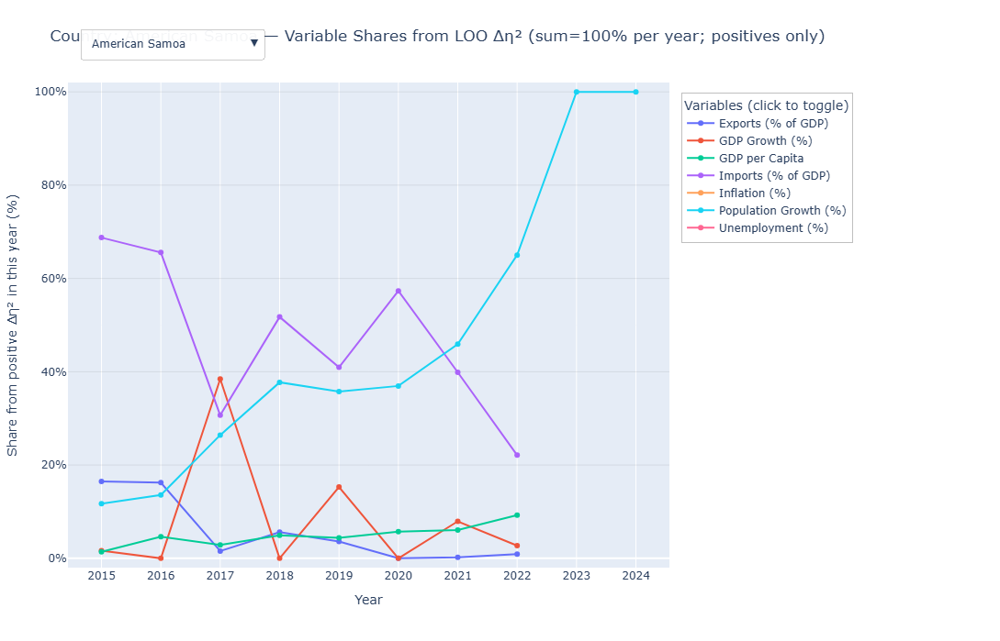

In [4]:
# ============================
# 每个国家×年×变量：去掉该国后的 η² 损失（LOO Δη²）与占比
# 不做任何填补；严格按留一法重算 η²
# ============================

import os
import numpy as np
import pandas as pd
import plotly.graph_objects as go

# ---------- 读取数据
CANDIDATES = ["WDI_Grouped.csv", "/mnt/data/WDI_Grouped.csv"]
csv_path = next((p for p in CANDIDATES if os.path.exists(p)), None)
if csv_path is None:
    raise FileNotFoundError("WDI_Grouped.csv not found. Put it next to the notebook or in /mnt/data/")

df = pd.read_csv(csv_path)
assert "Country Name" in df.columns
assert "Year" in df.columns and "Group" in df.columns

df["Year"] = pd.to_numeric(df["Year"], errors="coerce").astype("Int64")
# 如需限制时间窗口，取消下一行注释
# df = df[(df["Year"] >= 2015) & (df["Year"] <= 2024)].copy()

# ---------- 变量映射（按你表的列名）
raw_to_label = {
    "Exports_GDP_percent": "Exports (% of GDP)",
    "GDP growth (annual %)": "GDP Growth (%)",
    "GDP_per_capita":      "GDP per Capita",
    "Imports_GDP_percent": "Imports (% of GDP)",
    "Inflation, consumer prices (annual %)": "Inflation (%)",
    "Population_growth_percent": "Population Growth (%)",
    "Unemployment, total (% of total labor force) (national estimate)": "Unemployment (%)",
}
ind_cols    = list(raw_to_label.keys())
disp_labels = [raw_to_label[c] for c in ind_cols]

# ---------- 转成长表
long = df[["Country Name", "Year", "Group", *ind_cols]].melt(
    id_vars=["Country Name", "Year", "Group"],
    value_vars=ind_cols,
    var_name="Variable_raw",
    value_name="Value"
).rename(columns={"Country Name": "Country"})
long["Variable"] = long["Variable_raw"].map(raw_to_label)

# 仅保留 Value 与 Group、Country 都非空的记录（不做填补）
long = long[long["Value"].notna() & long["Group"].notna() & long["Country"].notna()].copy()
long["Value"] = long["Value"].astype(float)

# ---------- 计算函数：给定一个（年、变量）小样本，返回 η² 以及每个国家的 LOO η² 与 Δη²
EPS = 1e-12

def _eta2_from_stats(N, sum_x, sum_sq, mu, grp_n, grp_mu):
    """由整体与分组统计量计算 η²"""
    ss_total   = sum_sq - N * (mu ** 2)
    if ss_total <= 0:
        return np.nan
    ss_between = np.sum(grp_n * (grp_mu - mu) ** 2)
    return float(ss_between / ss_total)

def loo_eta2_contrib_one_panel(panel: pd.DataFrame):
    """
    panel: 某个（Year, Variable）的子表，包含列 [Country, Group, Value]
    输出：DataFrame，列含：
      Country, Group, Year, Variable, Value,
      eta2_all, eta2_loo, delta_eta2, delta_eta2_pos
    """
    # 基础统计
    x = panel["Value"].to_numpy(float)
    g = panel["Group"].to_numpy(object)
    c = panel["Country"].to_numpy(object)

    N = x.shape[0]
    if N < 3:
        # 样本过小，返回空（后续外层会合并）
        return pd.DataFrame(columns=[
            "Country","Group","Year","Variable","Value",
            "eta2_all","eta2_loo","delta_eta2","delta_eta2_pos"
        ])

    sum_x  = float(np.sum(x))
    sum_sq = float(np.sum(x * x))
    mu     = sum_x / N

    # 分组统计
    grp_df  = panel.groupby("Group", dropna=False)["Value"].agg(["count","mean"])
    grp_idx = grp_df.index.to_numpy(object)
    grp_n   = grp_df["count"].to_numpy(float)
    grp_mu  = grp_df["mean"].to_numpy(float)

    # 全体 η²
    eta2_all = _eta2_from_stats(N, sum_x, sum_sq, mu, grp_n, grp_mu)

    # 预建一个 group -> (n, mu) 的字典方便查表
    g2n  = dict(zip(grp_idx, grp_n))
    g2mu = dict(zip(grp_idx, grp_mu))

    rows = []
    for i in range(N):
        xi  = x[i]
        gi  = g[i]
        ci  = c[i]

        N1 = N - 1
        if N1 < 2:
            eta2_loo = np.nan
        else:
            sum_x1  = sum_x - xi
            sum_sq1 = sum_sq - xi * xi
            mu1     = sum_x1 / N1
            ss_total1 = sum_sq1 - N1 * (mu1 ** 2)

            if ss_total1 <= 0:
                eta2_loo = np.nan
            else:
                # 各组 n'、mu'（只有 gi 会变）
                ss_between1 = 0.0
                for gj in grp_idx:
                    nj = g2n[gj]
                    muj = g2mu[gj]
                    if gj == gi:
                        if nj <= 1:
                            # 该组被移空，直接略过（相当于 n'=0）
                            continue
                        nj1  = nj - 1
                        muj1 = (nj * muj - xi) / nj1
                        ss_between1 += nj1 * (muj1 - mu1) ** 2
                    else:
                        # 其它组 n/μ 不变，但整体均值变为 mu1
                        ss_between1 += nj * (muj - mu1) ** 2

                eta2_loo = float(ss_between1 / ss_total1)

        delta = (eta2_all - eta2_loo) if (np.isfinite(eta2_all) and np.isfinite(eta2_loo)) else np.nan
        rows.append({
            "Country": ci,
            "Group":   gi,
            "Year":    int(panel["Year"].iloc[0]),
            "Variable": panel["Variable"].iloc[0],
            "Value":   xi,
            "eta2_all": eta2_all,
            "eta2_loo": eta2_loo,
            "delta_eta2": delta,
            "delta_eta2_pos": max(delta, 0.0) if np.isfinite(delta) else np.nan,
        })

    return pd.DataFrame(rows)

# ---------- 主计算：遍历（Year, Variable）面板，拼接结果
all_parts = []
for (y, v), sub in long.groupby(["Year", "Variable"], sort=False):
    part = loo_eta2_contrib_one_panel(sub[["Country","Group","Year","Variable","Value"]].copy())
    all_parts.append(part)

country_eta_influence = pd.concat(all_parts, ignore_index=True)

# ---------- 在“国家×年”内把正向 Δη² 归一成占比（和=100）
country_eta_influence["sum_pos"] = (country_eta_influence
                                    .groupby(["Country","Year"])["delta_eta2_pos"]
                                    .transform("sum"))

country_eta_influence["share_pos_pct"] = np.where(
    (country_eta_influence["sum_pos"] > 0) & country_eta_influence["delta_eta2_pos"].notna(),
    country_eta_influence["delta_eta2_pos"] / country_eta_influence["sum_pos"] * 100.0,
    np.nan
)

# 仅保留我们关心的列
country_eta_influence = country_eta_influence[[
    "Country","Year","Group","Variable","Value",
    "eta2_all","eta2_loo","delta_eta2","delta_eta2_pos","share_pos_pct"
]].sort_values(["Country","Year","Variable"]).reset_index(drop=True)

# 一个便于直接绘图的宽表（可选）
country_share_pct = (country_eta_influence
                     .pivot_table(index=["Country","Year"],
                                  columns="Variable",
                                  values="share_pos_pct",
                                  aggfunc="first")
                     .reset_index())

# ============================
# 可视化：国家折线（下拉选择）
# y 轴使用 share_pos_pct（该国该年 7 变量的正向 Δη² 占比，和=100）
# ============================
years_all = sorted(country_eta_influence["Year"].dropna().unique().astype(int).tolist())
countries = sorted(country_eta_influence["Country"].dropna().unique().tolist())
if not countries:
    raise ValueError("No countries available after filtering/NA removal.")
init_country = countries[0]

def arrays_for_country(country: str):
    ylist, cdlist = [], []
    cdf = country_eta_influence[country_eta_influence["Country"] == country]
    for var in disp_labels:
        vdf = cdf[cdf["Variable"] == var]
        mp_share = dict(zip(vdf["Year"], vdf["share_pos_pct"]))
        mp_val   = dict(zip(vdf["Year"], vdf["Value"]))
        mp_group = dict(zip(vdf["Year"], vdf["Group"]))
        mp_signed= dict(zip(vdf["Year"], vdf["delta_eta2"]))  # 便于 Hover 看正负
        y_arr, cd_arr = [], []
        for y in years_all:
            s = mp_share.get(y, np.nan)
            v = mp_val.get(y,   np.nan)
            g = mp_group.get(y, None)
            d = mp_signed.get(y, np.nan)
            y_arr.append(float(s) if pd.notna(s) else None)
            cd_arr.append([y,
                           (float(s) if pd.notna(s) else None),
                           (float(v) if pd.notna(v) else None),
                           g,
                           (float(d) if pd.notna(d) else None)])
        ylist.append(y_arr)
        cdlist.append(cd_arr)
    return ylist, cdlist

init_y, init_cd = arrays_for_country(init_country)
fig = go.Figure()

hover_tmpl = (
    "Year: %{customdata[0]}<br>"
    "Share (Δη²>0, normalized): %{customdata[1]:.2f}%<br>"
    "Value: %{customdata[2]:.6g}<br>"
    "Group: %{customdata[3]}<br>"
    "Signed Δη²: %{customdata[4]:.4f}<extra></extra>"
)

for i, var in enumerate(disp_labels):
    fig.add_trace(go.Scatter(
        x=years_all,
        y=init_y[i],
        customdata=init_cd[i],
        mode="lines+markers",
        name=var,
        hovertemplate=hover_tmpl,
        line=dict(width=2),
        marker=dict(size=6),
        connectgaps=False
    ))

buttons = []
for c in countries:
    ys, cds = arrays_for_country(c)
    buttons.append(dict(
        label=c,
        method="update",
        args=[
            {"y": ys, "customdata": cds},
            {"title": f"Country: {c} — Variable Shares from LOO Δη² (sum=100% per year; positives only)"}
        ]
    ))

fig.update_layout(
    title=f"Country: {init_country} — Variable Shares from LOO Δη² (sum=100% per year; positives only)",
    xaxis_title="Year",
    yaxis_title="Share from positive Δη² in this year (%)",
    xaxis=dict(
        tickmode="array",
        tickvals=years_all,
        ticktext=[str(y) for y in years_all],
        dtick=1,
        rangeslider=dict(visible=False),
        rangeselector=dict(visible=False)
    ),
    yaxis=dict(range=[-2, 102], ticksuffix="%", gridcolor="rgba(0,0,0,0.08)"),
    width=1120, height=680,
    margin=dict(l=70, r=360, t=90, b=80),
    legend=dict(
        title="Variables (click to toggle)",
        orientation="v",
        yanchor="top", y=0.98,
        xanchor="left", x=1.02,
        bgcolor="rgba(255,255,255,0.92)",
        bordercolor="rgba(0,0,0,0.25)", borderwidth=1,
        itemclick="toggle", itemdoubleclick="toggleothers",
        font=dict(size=12),
    ),
    hovermode="x",
    updatemenus=[dict(
        type="dropdown", direction="down", showactive=True,
        x=0.01, xanchor="left", y=1.12, yanchor="top",
        bgcolor="rgba(255,255,255,0.95)",
        bordercolor="rgba(0,0,0,0.2)", borderwidth=1,
        pad={"r": 6, "t": 4, "b": 4, "l": 6},
        buttons=buttons,
    )]
)

fig.show()

# ============================
# 你关心的两张表：
# 1) country_eta_influence   : 每国×年×变量的 η²(all)、η²(-i) 与 Δη²，以及 share_pos_pct
# 2) country_share_pct       : 宽表，便于做图或导出
# ============================
# print(country_eta_influence.head(12))
# print(country_share_pct.head(12))
country_eta_influence.to_csv("country_eta_influence.csv")
country_share_pct.to_csv("country_share_pct.csv")

In [ ]:
分组解决了